<a href="https://colab.research.google.com/github/rayanrouf/Data-Augmentation-using-GANs-for-NIH-Chest-X-Ray-Dataset/blob/main/CycleGAN_from_scratch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# !pip install numpy==1.21.6
# !pip install transformers datasets
# !pip install transformers[torch]
# !pip install accelerate -U
# !pip install accelerate>=0.20.1
# !pip install -U accelerate
!pip install -U transformers
!pip install tensorflow
!pip install tensorflow_addons
# !pip install grad-cam
!pip install glob


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.0/9.0 MB 24.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 53.9 MB/s eta 0:00:00
  Attempting uninstall: tokenizers
    Found existing installation: tokenizers 0.15.2
    Uninstalling tokenizers-0.15.2:
      Successfully uninstalled tokenizers-0.15.2
  Attempting uninstall: transformers
    Found existing installation: transformers 4.38.2
    Uninstalling transformers-4.38.2:
      Successfully uninstalled transformers-4.38.2
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.8/611.8 kB 8.5 MB/s eta 0:00:00
ERROR: Could not find a version that satisfies the requirement glob (from versions: none)
ERROR: No matching distribution found for glob


In [ ]:
# from datasets import load_dataset, load_metric
import cv2
import numpy as np
import pandas as pd

from PIL import Image

import os
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

import tensorflow_addons as tfa
import tensorflow_datasets as tfds
from glob import glob, iglob

from google.colab.patches import cv2_imshow
from sklearn.model_selection import train_test_split
from joblib import Parallel, delayed

tfds.disable_progress_bar()
autotune = tf.data.AUTOTUNE


/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [ ]:
def filter_by_disease(df, disease):
  print(f'There are {df[df["Finding Labels"] == disease].shape} cases of {disease}.')
  return df[df['Finding Labels'] == disease]

In [ ]:

df = pd.read_csv("/content/drive/MyDrive/CS 518 Project /sample_labels.csv")
all_image_paths = {os.path.basename(x): x for x in glob('/content/drive/MyDrive/CS 518 Project /images/*.png')}
print('Images found:', len(all_image_paths), ', Total Headers', df.shape[0])

# df = df[df['Finding Labels'] != 'No Finding']
df['path'] = df['Image Index'].map(all_image_paths.get)
df['Patient Age'] = df['Patient Age'].map(lambda x: int(x[:-1]))


df = df[df['path'].notnull()]
df.reset_index(inplace=True)



Images found: 5606 , Total Headers 5606


In [ ]:
df

,index,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImageWidth,OriginalImageHeight,OriginalImagePixelSpacing_x,OriginalImagePixelSpacing_y,path
0,0,00000013_005.png,Emphysema|Infiltration|Pleural_Thickening|Pneu...,5,13,60,M,AP,3056,2544,0.139000,0.139000,/content/drive/MyDrive/CS 518 Project /images/...
1,1,00000013_026.png,Cardiomegaly|Emphysema,26,13,57,M,AP,2500,2048,0.168000,0.168000,/content/drive/MyDrive/CS 518 Project /images/...
2,2,00000017_001.png,No Finding,1,17,77,M,AP,2500,2048,0.168000,0.168000,/content/drive/MyDrive/CS 518 Project /images/...
3,3,00000030_001.png,Atelectasis,1,30,79,M,PA,2992,2991,0.143000,0.143000,/content/drive/MyDrive/CS 518 Project /images/...
4,4,00000032_001.png,Cardiomegaly|Edema|Effusion,1,32,55,F,AP,2500,2048,0.168000,0.168000,/content/drive/MyDrive/CS 518 Project /images/...
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5601,5601,00030712_000.png,No Finding,0,30712,58,M,PA,2021,2021,0.194311,0.194311,/content/drive/MyDrive/CS 518 Project /images/...
5602,5602,00030786_005.png,Cardiomegaly|Effusion|Emphysema,5,30786,61,F,AP,3056,2544,0.139000,0.139000,/content/drive/MyDrive/CS 518 Project /images/...
5603,5603,00030789_000.png,Infiltration,0,30789,52,F,PA,2021,2021,0.194311,0.194311,/content/drive/MyDrive/CS 518 Project /images/...
5604,5604,00030792_000.png,No Finding,0,30792,10,F,PA,1775,1712,0.194311,0.194311,/content/drive/MyDrive/CS 518 Project /images/...


In [ ]:
disease_list = ['Atelectasis',
 'Cardiomegaly',
 'Consolidation',
 'Edema',
 'Effusion',
 'Emphysema',
 'Infiltration',
 'Mass',
 'Nodule',
 'Pleural_Thickening',
 'Pneumothorax']

In [ ]:
df['Finding Labels'].value_counts()[:12]

Finding Labels
No Finding                  3044
Infiltration                 503
Effusion                     203
Atelectasis                  192
Nodule                       144
Pneumothorax                 114
Mass                          99
Consolidation                 72
Effusion|Infiltration         69
Pleural_Thickening            65
Atelectasis|Infiltration      57
Atelectasis|Effusion          55
Name: count, dtype: int64

### Processing Images

In [ ]:
def preprocess_image(image):
    # Convert PIL image to NumPy array

    resized = image.resize((256, 256))
    image_array = np.array(resized)
    # Normalize pixel values if needed (optional)
    # image_array = image_array / 255.0
    return image_array



In [ ]:
d_id = 0

In [ ]:
disease = disease_list[d_id]

In [ ]:
df_dis = filter_by_disease(df, disease_list[d_id])
df_org = filter_by_disease(df, "No Finding").sample(df_dis.shape[0])

There are (192, 13) cases of Atelectasis.
There are (3044, 13) cases of No Finding.


In [ ]:
train_org, test_org, train_dis, test_dis = train_test_split(df_org['path'], df_dis['path'], test_size=0.2, random_state=42)

In [ ]:
def read_and_process_images(read_paths):
  processed_images = []
  # label_arr = []

  for i in range(len(read_paths)):
    ipath = read_paths[i]
    # ilabel = labels[i]

    img = Image.open(ipath)
    pp_img = preprocess_image(img)
    if pp_img.shape == (256,256):
      processed_images.append(pp_img)
      # label_arr.append(ilabel)
  return np.array(processed_images)

In [ ]:
# processed_images_train_org = read_and_process_images(list(train_org))
processed_images_train_dis = read_and_process_images(list(train_dis))

# processed_images_test_org = read_and_process_images(list(test_org))
processed_images_test_dis = read_and_process_images(list(test_dis))

In [ ]:
len(processed_images_train_dis)

153

In [ ]:
len(processed_images_test_dis)

39

### Creating TF dataset

In [ ]:
def create_tf_dataset(processed_images):
  tf_images = tf.convert_to_tensor(processed_images, dtype=tf.float32)

  # Expand dimensions to represent a single channel (assuming grayscale images)
  tf_images = tf.expand_dims(tf_images, axis=-1)

  tf_dataset = tf.data.Dataset.from_tensor_slices(tf_images)

  return tf_dataset

In [ ]:
tf_dataset_train_org = create_tf_dataset(processed_images_train_org)
tf_dataset_test_org = create_tf_dataset(processed_images_test_org)

tf_dataset_train_dis = create_tf_dataset(processed_images_train_dis)
tf_dataset_test_dis = create_tf_dataset(processed_images_test_dis)

In [ ]:

# Define the standard image size.
orig_img_size = (256, 256, 3)
# Size of the random crops to be used during training.
input_img_size = (128, 128, 3)
# Weights initializer for the layers.
kernel_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)
# Gamma initializer for instance normalization.
gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

buffer_size = 32
batch_size = 1


def normalize_img(img):
    img = tf.cast(img, dtype=tf.float32)
    # Map values in the range [-1, 1]
    # return img
    return (img / 127.5) - 1.0



import tensorflow as tf

def random_brightness_contrast_intensity(image, max_delta_brightness=0.0005, max_delta_contrast=0.0005):
    """
    Randomly adjusts the brightness, contrast, and intensity of the input image tensor.

    Args:
        image: A TensorFlow tensor representing the input image. It should have shape [height, width, channels].
        max_delta_brightness: Maximum change in brightness (range 0 to 1).
        max_delta_contrast: Maximum change in contrast (range 0 to 1).
        max_delta_intensity: Maximum change in intensity (range 0 to 1).

    Returns:
        Adjusted image tensor.
    """
    # Randomly adjust brightness
    delta_brightness = tf.random.uniform([], -max_delta_brightness, max_delta_brightness)
    brightness_image = tf.image.adjust_brightness(image, delta_brightness)

    # Randomly adjust contrast
    delta_contrast = tf.random.uniform([], 1 - max_delta_contrast, 1 + max_delta_contrast)
    contrast_image = tf.image.adjust_contrast(brightness_image, delta_contrast)

    # # Randomly adjust intensity
    # delta_intensity = tf.random.uniform([], -max_delta_intensity, max_delta_intensity)
    # intensity_image = tf.clip_by_value(contrast_image + delta_intensity, 0.1, 0.9)

    return contrast_image



def preprocess_train_image_org(img):
    # Random flip
    img = tf.image.random_flip_left_right(img)
    # Resize to the original size first
    img = tf.image.resize(img, [orig_img_size[0], orig_img_size[1]])
    # Random crop to 256X256
    # img = tf.image.random_crop(img, size=[max(orig_img_size[0], img.shape[0]), max(orig_img_size[1], img.shape[1]), input_img_size[2]])
    # Normalize the pixel values in the range [-1, 1]
    img = normalize_img(img)
    return img

def preprocess_train_image_aug(img):
    # Random flip
    img = tf.image.random_flip_left_right(img)
    # Resize to the original size first
    img = tf.image.resize(img, [orig_img_size[0], orig_img_size[1]])
    # Random crop to 256X256
    # img = tf.image.random_crop(img, size=[max(orig_img_size[0], img.shape[0]), max(orig_img_size[1], img.shape[1]), input_img_size[2]])
    # Normalize the pixel values in the range [-1, 1]
    img = normalize_img(img)
    img = random_brightness_contrast_intensity(img)
    return img


def preprocess_test_image(img):
    # Only resizing and normalization for the test images.
    img = tf.image.resize(img, [orig_img_size[0], orig_img_size[1]])
    img = normalize_img(img)
    return img



In [ ]:
tf_dataset_train_org_processed = (
    tf_dataset_train_org.map(preprocess_train_image_org, num_parallel_calls=autotune)
    # .cache()
    # .shuffle(buffer_size)
    .batch(batch_size)
)

tf_dataset_train_dis_processed = (
    tf_dataset_train_dis.map(preprocess_train_image_org, num_parallel_calls=autotune)
    # .cache()
    # .shuffle(buffer_size)
    .batch(batch_size)
)
tf_dataset_test_org_processed = (
    tf_dataset_test_org.map(preprocess_test_image, num_parallel_calls=autotune)
    # .cache()
    # .shuffle(buffer_size)
    .batch(batch_size)
)
tf_dataset_test_dis_processed = (
    tf_dataset_test_dis.map(preprocess_test_image, num_parallel_calls=autotune)
    # .cache()
    # .shuffle(buffer_size)
    .batch(batch_size)
)


In [ ]:

class ReflectionPadding2D(layers.Layer):
    """Implements Reflection Padding as a layer.

    Args:
        padding(tuple): Amount of padding for the
        spatial dimensions.

    Returns:
        A padded tensor with the same type as the input tensor.
    """

    def __init__(self, padding=(1, 1), **kwargs):
        self.padding = tuple(padding)
        super().__init__(**kwargs)

    def call(self, input_tensor, mask=None):
        padding_width, padding_height = self.padding
        padding_tensor = [
            [0, 0],
            [padding_height, padding_height],
            [padding_width, padding_width],
            [0, 0],
        ]
        return tf.pad(input_tensor, padding_tensor, mode="REFLECT")


def residual_block(
    x,
    activation,
    kernel_initializer=kernel_init,
    kernel_size=(3, 3),
    strides=(1, 1),
    padding="valid",
    gamma_initializer=gamma_init,
    use_bias=False,
):
    dim = x.shape[-1]
    input_tensor = x

    x = ReflectionPadding2D()(input_tensor)
    x = layers.Conv2D(
        dim,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = activation(x)

    x = ReflectionPadding2D()(x)
    x = layers.Conv2D(
        dim,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = layers.add([input_tensor, x])
    return x


def downsample(
    x,
    filters,
    activation,
    kernel_initializer=kernel_init,
    kernel_size=(3, 3),
    strides=(2, 2),
    padding="same",
    gamma_initializer=gamma_init,
    use_bias=False,
):
    x = layers.Conv2D(
        filters,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    if activation:
        x = activation(x)
    return x


def upsample(
    x,
    filters,
    activation,
    kernel_size=(3, 3),
    strides=(2, 2),
    padding="same",
    kernel_initializer=kernel_init,
    gamma_initializer=gamma_init,
    use_bias=False,
):
    x = layers.Conv2DTranspose(
        filters,
        kernel_size,
        strides=strides,
        padding=padding,
        kernel_initializer=kernel_initializer,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    if activation:
        x = activation(x)
    return x


In [ ]:

def get_resnet_generator(
    filters=32,
    kernel_initializer=kernel_init,
    input_img_size=(256, 256, 1),
    num_downsampling_blocks=2,
    num_residual_blocks=9,
    num_upsample_blocks=2,
    gamma_initializer=gamma_init,
    name=None,
):
    img_input = layers.Input(shape=input_img_size, name=name + "_img_input")
    x = ReflectionPadding2D(padding=(3, 3))(img_input)
    x = layers.Conv2D(filters, (7, 7), kernel_initializer=kernel_init, use_bias=False)(
        x
    )
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = layers.Activation("relu")(x)

    # Downsampling
    for _ in range(num_downsampling_blocks):
        filters *= 2
        x = downsample(x, filters=filters, activation=layers.Activation("relu"))

    # Residual blocks
    for _ in range(num_residual_blocks):
        x = residual_block(x, activation=layers.Activation("relu"))

    # Upsampling
    for _ in range(num_upsample_blocks):
        filters //= 2
        x = upsample(x, filters, activation=layers.Activation("relu"))

    # Final block
    x = ReflectionPadding2D(padding=(3, 3))(x)
    x = layers.Conv2D(3, (7, 7), padding="valid", )(x)
    x = layers.Activation("tanh")(x)

    model = keras.models.Model(img_input, x, name=name)
    return model


In [ ]:

def get_discriminator(
    filters=128, kernel_initializer=kernel_init, num_downsampling=3, name=None,
    input_img_size=(256, 256, 1)
):
    img_input = layers.Input(shape=input_img_size, name=name + "_img_input")
    x = layers.Conv2D(
        filters,
        (4, 4),
        strides=(2, 2),
        padding="same",
        kernel_initializer=kernel_initializer,
    )(img_input)
    x = layers.LeakyReLU(0.2)(x)

    num_filters = filters
    for num_downsample_block in range(3):
        num_filters *= 2
        if num_downsample_block < 2:
            x = downsample(
                x,
                filters=num_filters,
                activation=layers.LeakyReLU(0.2),
                kernel_size=(4, 4),
                strides=(2, 2),
            )
        else:
            x = downsample(
                x,
                filters=num_filters,
                activation=layers.LeakyReLU(0.2),
                kernel_size=(4, 4),
                strides=(1, 1),
            )

    x = layers.Conv2D(
        1, (4, 4), strides=(1, 1), padding="same", kernel_initializer=kernel_initializer
    )(x)

    model = keras.models.Model(inputs=img_input, outputs=x, name=name)
    return model




In [ ]:
# Get the generators
gen_G = get_resnet_generator(name="generator_G")
gen_F = get_resnet_generator(name="generator_F")

# Get the discriminators
disc_X = get_discriminator(name="discriminator_X")
disc_Y = get_discriminator(name="discriminator_Y")


/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


In [ ]:

class CycleGan(keras.Model):
    def __init__(
        self,
        generator_G,
        generator_F,
        discriminator_X,
        discriminator_Y,
        lambda_cycle=10.0,
        lambda_identity=0.75,
    ):
        super().__init__()
        self.gen_G = generator_G
        self.gen_F = generator_F
        self.disc_X = discriminator_X
        self.disc_Y = discriminator_Y
        self.lambda_cycle = lambda_cycle
        self.lambda_identity = lambda_identity

    def call(self, inputs):
        return (
            self.disc_X(inputs),
            self.disc_Y(inputs),
            self.gen_G(inputs),
            self.gen_F(inputs),
        )

    def compile(
        self,
        gen_G_optimizer,
        gen_F_optimizer,
        disc_X_optimizer,
        disc_Y_optimizer,
        gen_loss_fn,
        disc_loss_fn,
    ):
        super().compile()
        self.gen_G_optimizer = gen_G_optimizer
        self.gen_F_optimizer = gen_F_optimizer
        self.disc_X_optimizer = disc_X_optimizer
        self.disc_Y_optimizer = disc_Y_optimizer
        self.generator_loss_fn = gen_loss_fn
        self.discriminator_loss_fn = disc_loss_fn
        self.cycle_loss_fn = keras.losses.MeanSquaredError()
        self.identity_loss_fn = keras.losses.MeanSquaredError()

    def train_step(self, batch_data):
        # x is Horse and y is zebra
        real_x, real_y = batch_data

        # For CycleGAN, we need to calculate different
        # kinds of losses for the generators and discriminators.
        # We will perform the following steps here:
        #
        # 1. Pass real images through the generators and get the generated images
        # 2. Pass the generated images back to the generators to check if we
        #    can predict the original image from the generated image.
        # 3. Do an identity mapping of the real images using the generators.
        # 4. Pass the generated images in 1) to the corresponding discriminators.
        # 5. Calculate the generators total loss (adversarial + cycle + identity)
        # 6. Calculate the discriminators loss
        # 7. Update the weights of the generators
        # 8. Update the weights of the discriminators
        # 9. Return the losses in a dictionary

        with tf.GradientTape(persistent=True) as tape:


            # Healthy to diseased scan, X->Y
            fake_y = self.gen_G(real_x, training=True)
            # diseased to healthy scan, Y->X
            fake_x = self.gen_F(real_y, training=True)


            fake_y = tf.reshape(fake_y, (-1, 256, 256, 1))
            fake_x = tf.reshape(fake_x, (-1, 256, 256, 1))

            # Cycle (Healthy to fake diseased to fake healthy): x -> y -> x
            cycled_x = self.gen_F(fake_y, training=True)
            # Cycle (Diseased to fake healthy to fake diseased) y -> x -> y
            cycled_y = self.gen_G(fake_x, training=True)

            # Identity mapping
            same_x = self.gen_F(real_x, training=True)
            same_y = self.gen_G(real_y, training=True)

            # Discriminator output
            disc_real_x = self.disc_X(real_x, training=True)
            disc_fake_x = self.disc_X(fake_x, training=True)

            disc_real_y = self.disc_Y(real_y, training=True)
            disc_fake_y = self.disc_Y(fake_y, training=True)

            # Generator adversarial loss
            gen_G_loss = self.generator_loss_fn(disc_fake_y)
            gen_F_loss = self.generator_loss_fn(disc_fake_x)

            # Generator cycle loss
            cycle_loss_G = self.cycle_loss_fn(real_y, cycled_y) * self.lambda_cycle
            cycle_loss_F = self.cycle_loss_fn(real_x, cycled_x) * self.lambda_cycle

            # Generator identity loss
            id_loss_G = (
                self.identity_loss_fn(real_y, same_y)
                * self.lambda_cycle
                * self.lambda_identity
            )
            id_loss_F = (
                self.identity_loss_fn(real_x, same_x)
                * self.lambda_cycle
                * self.lambda_identity
            )

            # Total generator loss
            total_loss_G = gen_G_loss + cycle_loss_G + id_loss_G
            total_loss_F = gen_F_loss + cycle_loss_F + id_loss_F

            # Discriminator loss
            disc_X_loss = self.discriminator_loss_fn(disc_real_x, disc_fake_x)
            disc_Y_loss = self.discriminator_loss_fn(disc_real_y, disc_fake_y)

        # Get the gradients for the generators
        grads_G = tape.gradient(total_loss_G, self.gen_G.trainable_variables)
        grads_F = tape.gradient(total_loss_F, self.gen_F.trainable_variables)

        # Get the gradients for the discriminators
        disc_X_grads = tape.gradient(disc_X_loss, self.disc_X.trainable_variables)
        disc_Y_grads = tape.gradient(disc_Y_loss, self.disc_Y.trainable_variables)

        # Update the weights of the generators
        self.gen_G_optimizer.apply_gradients(
            zip(grads_G, self.gen_G.trainable_variables)
        )
        self.gen_F_optimizer.apply_gradients(
            zip(grads_F, self.gen_F.trainable_variables)
        )

        # Update the weights of the discriminators
        self.disc_X_optimizer.apply_gradients(
            zip(disc_X_grads, self.disc_X.trainable_variables)
        )
        self.disc_Y_optimizer.apply_gradients(
            zip(disc_Y_grads, self.disc_Y.trainable_variables)
        )

        return {
            "G_loss": total_loss_G,
            "F_loss": total_loss_F,
            "D_X_loss": disc_X_loss,
            "D_Y_loss": disc_Y_loss,
        }


In [ ]:

class GANMonitor(keras.callbacks.Callback):
    """A callback to generate and save images after each epoch"""

    def __init__(self, num_img=4):
        self.num_img = num_img

    def on_epoch_end(self, epoch, logs=None):
        _, ax = plt.subplots(4, 2, figsize=(12, 12))
        # tf_dataset_test_org_processed = tf_dataset_test_org_processed.shuffle(10)
        for i, img in enumerate(tf_dataset_test_org_processed.shuffle(10).take(self.num_img)):
            prediction = self.model.gen_G(img)[0].numpy()
            prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
            img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

            ax[i, 0].imshow(img)
            ax[i, 1].imshow(prediction)
            ax[i, 0].set_title("Input image")
            ax[i, 1].set_title("Translated image")
            ax[i, 0].axis("off")
            ax[i, 1].axis("off")

            prediction = keras.utils.array_to_img(prediction)
            # prediction.save(
            #     "generated_img_{i}_{epoch}.png".format(i=i, epoch=epoch + 1)
            # )
            prediction.save("/content/drive/MyDrive/CS 518 Project /Augmented images/{dis}/{dis}_{i}_{epoch}.png".format(dis=disease, i=i+1, epoch=epoch + 1))
        plt.show()
        plt.close()


In [ ]:

# Loss function for evaluating adversarial loss
adv_loss_fn = keras.losses.MeanSquaredError()

# Define the loss function for the generators
def generator_loss_fn(fake):
    fake_loss = adv_loss_fn(tf.ones_like(fake), fake)
    return fake_loss


# Define the loss function for the discriminators
def discriminator_loss_fn(real, fake):
    real_loss = adv_loss_fn(tf.ones_like(real), real)
    fake_loss = adv_loss_fn(tf.zeros_like(fake), fake)
    return (real_loss + fake_loss) * 0.5


# Create cycle gan model
cycle_gan_model = CycleGan(
    generator_G=gen_G, generator_F=gen_F, discriminator_X=disc_X, discriminator_Y=disc_Y
)

# Compile the model
cycle_gan_model.compile(
    gen_G_optimizer=keras.optimizers.legacy.Adam(learning_rate=5e-5, beta_1=0.9),
    gen_F_optimizer=keras.optimizers.legacy.Adam(learning_rate=5e-5, beta_1=0.9),
    disc_X_optimizer=keras.optimizers.legacy.Adam(learning_rate=5e-5, beta_1=0.9),
    disc_Y_optimizer=keras.optimizers.legacy.Adam(learning_rate=5e-5, beta_1=0.9),
    gen_loss_fn=generator_loss_fn,
    disc_loss_fn=discriminator_loss_fn,
)
# Callbacks
plotter = GANMonitor()
checkpoint_filepath = "./model_checkpoints/cyclegan_checkpoints.{epoch:03d}"
model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True
)



Epoch 1/25
79/79 [==============================] - ETA: 0s - G_loss: 4.6680 - F_loss: 5.0733 - D_X_loss: 0.2512 - D_Y_loss: 0.2515

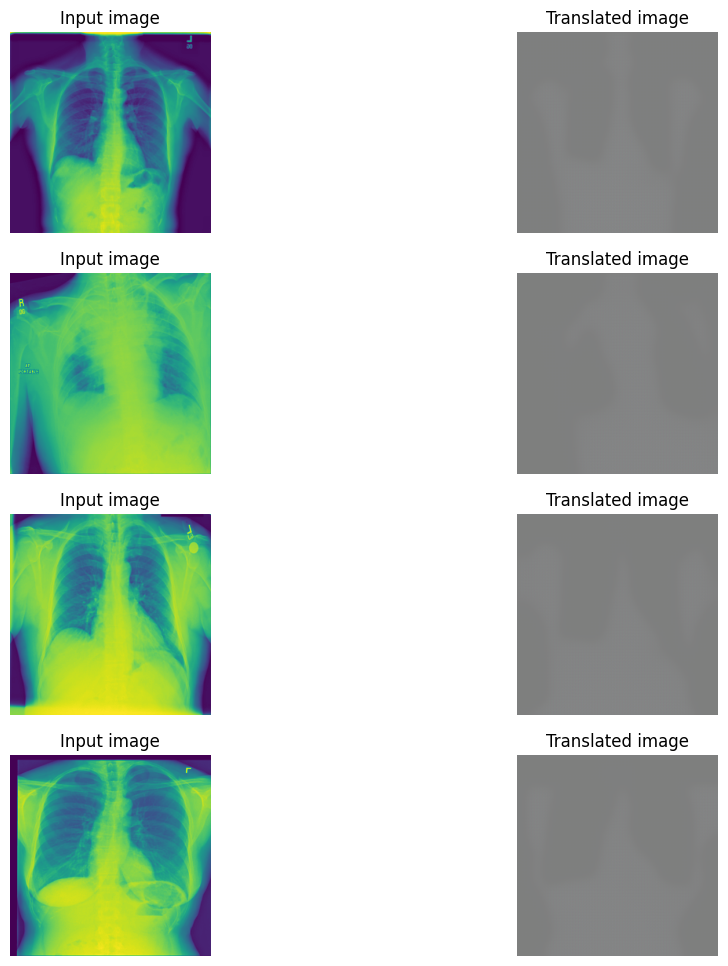

79/79 [==============================] - 68s 172ms/step - G_loss: 4.6783 - F_loss: 5.0688 - D_X_loss: 0.2495 - D_Y_loss: 0.2497
Epoch 2/25
79/79 [==============================] - ETA: 0s - G_loss: 3.9911 - F_loss: 4.4629 - D_X_loss: 0.0704 - D_Y_loss: 0.0724

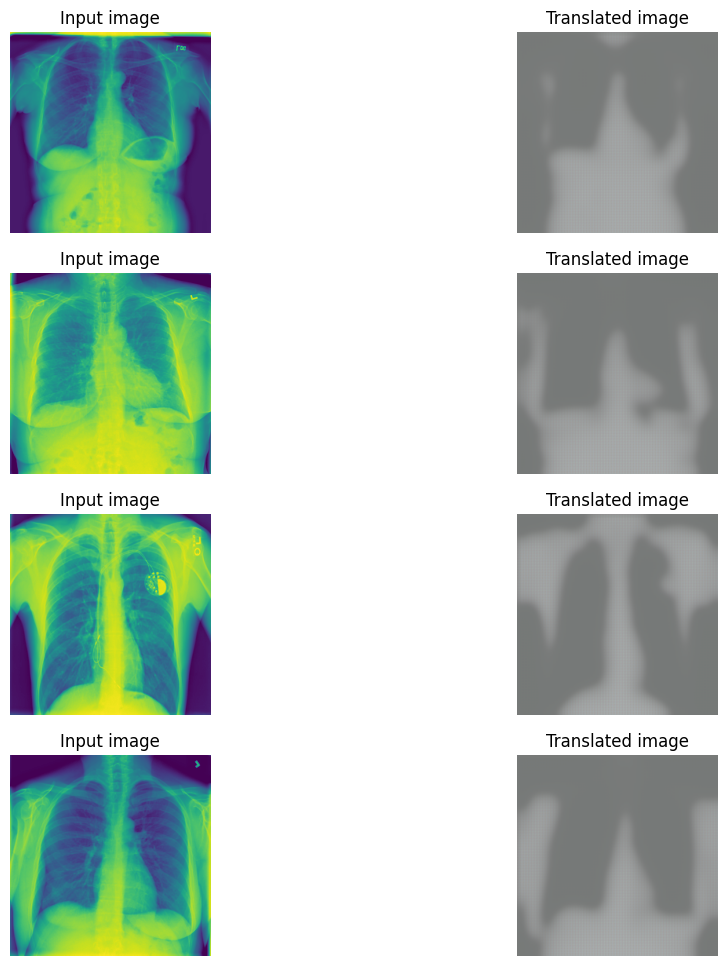

79/79 [==============================] - 14s 171ms/step - G_loss: 3.9980 - F_loss: 4.4576 - D_X_loss: 0.0700 - D_Y_loss: 0.0718
Epoch 3/25
79/79 [==============================] - ETA: 0s - G_loss: 3.3854 - F_loss: 3.6876 - D_X_loss: 0.0331 - D_Y_loss: 0.0345

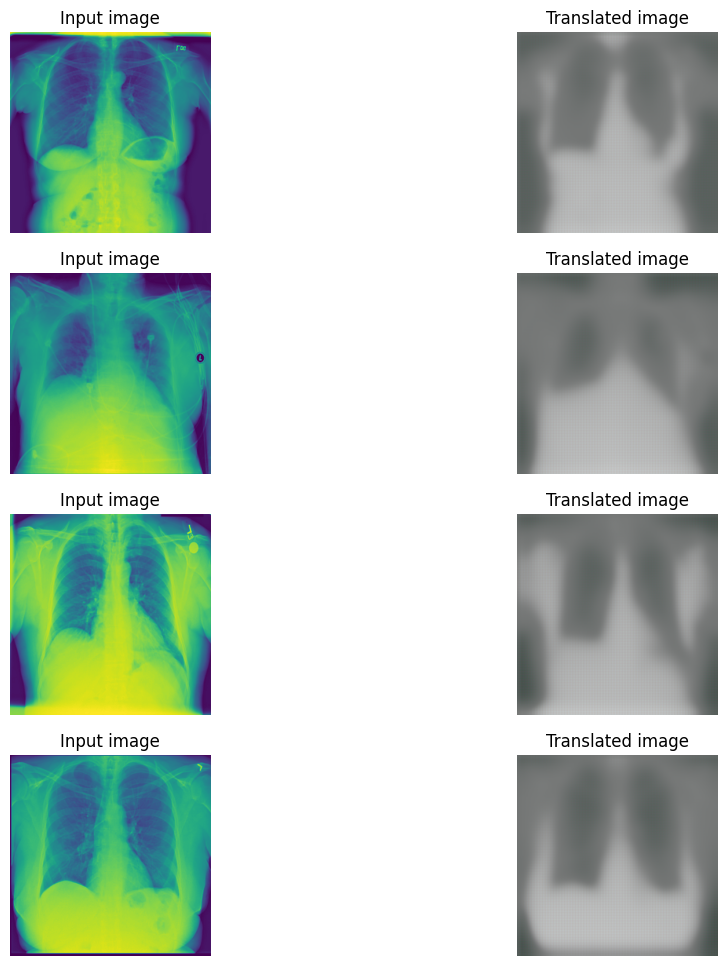

79/79 [==============================] - 14s 173ms/step - G_loss: 3.3886 - F_loss: 3.6825 - D_X_loss: 0.0329 - D_Y_loss: 0.0341
Epoch 4/25
79/79 [==============================] - ETA: 0s - G_loss: 3.1625 - F_loss: 3.4438 - D_X_loss: 0.0250 - D_Y_loss: 0.0278

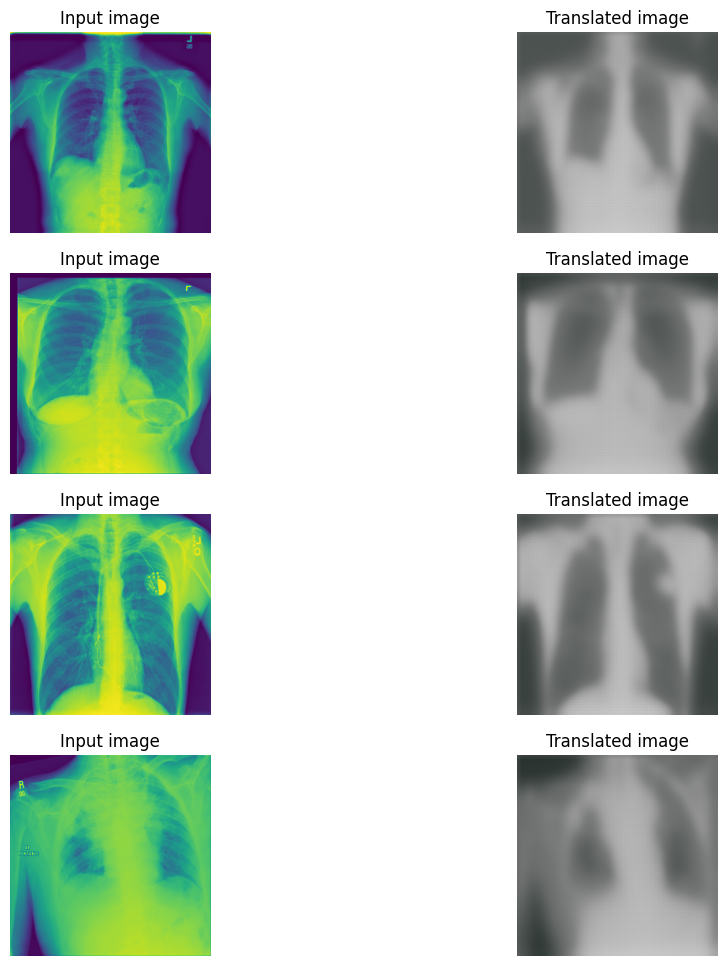

79/79 [==============================] - 14s 174ms/step - G_loss: 3.1651 - F_loss: 3.4410 - D_X_loss: 0.0248 - D_Y_loss: 0.0275
Epoch 5/25
79/79 [==============================] - ETA: 0s - G_loss: 3.1888 - F_loss: 3.4093 - D_X_loss: 0.0129 - D_Y_loss: 0.0166

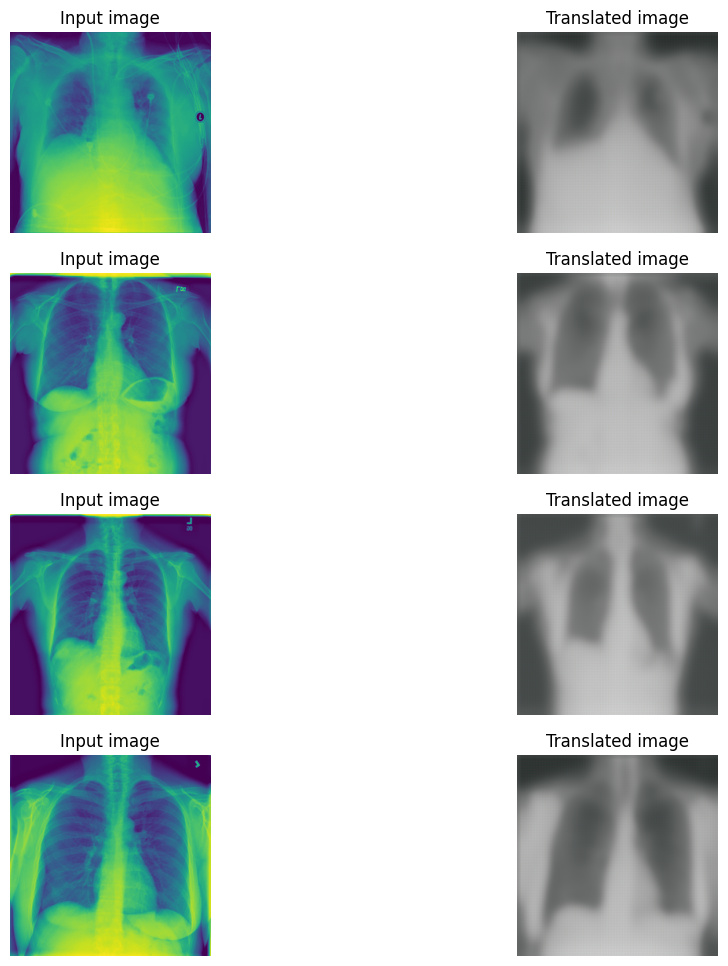

79/79 [==============================] - 14s 173ms/step - G_loss: 3.1936 - F_loss: 3.4087 - D_X_loss: 0.0127 - D_Y_loss: 0.0164
Epoch 6/25
79/79 [==============================] - ETA: 0s - G_loss: 3.1842 - F_loss: 3.3391 - D_X_loss: 0.0095 - D_Y_loss: 0.0110

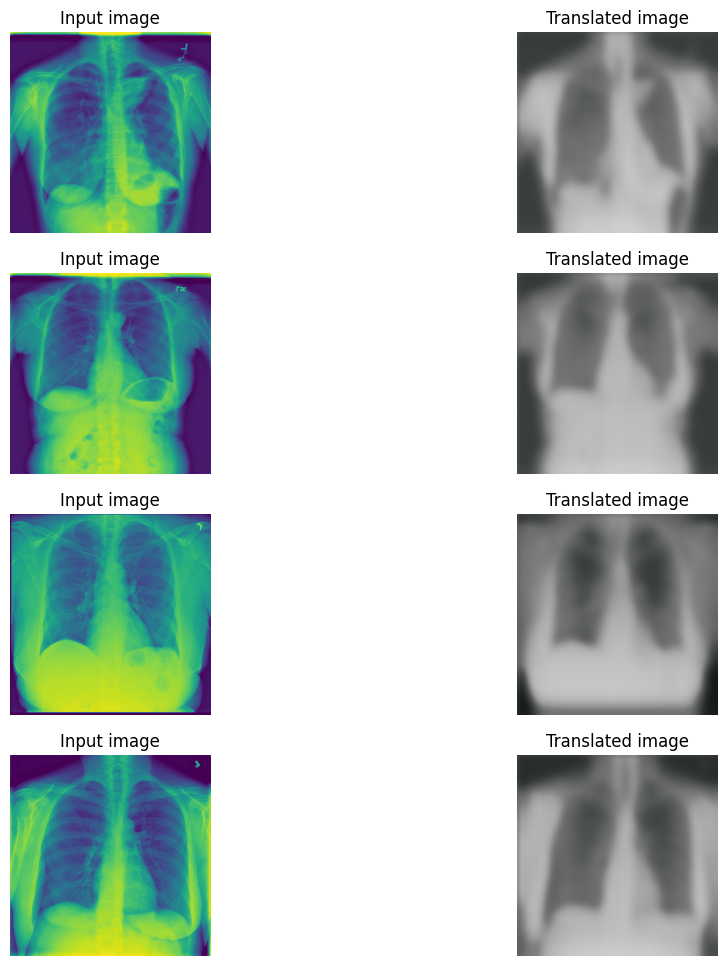

79/79 [==============================] - 14s 173ms/step - G_loss: 3.1892 - F_loss: 3.3398 - D_X_loss: 0.0094 - D_Y_loss: 0.0109
Epoch 7/25
79/79 [==============================] - ETA: 0s - G_loss: 3.1111 - F_loss: 3.2825 - D_X_loss: 0.0077 - D_Y_loss: 0.0082

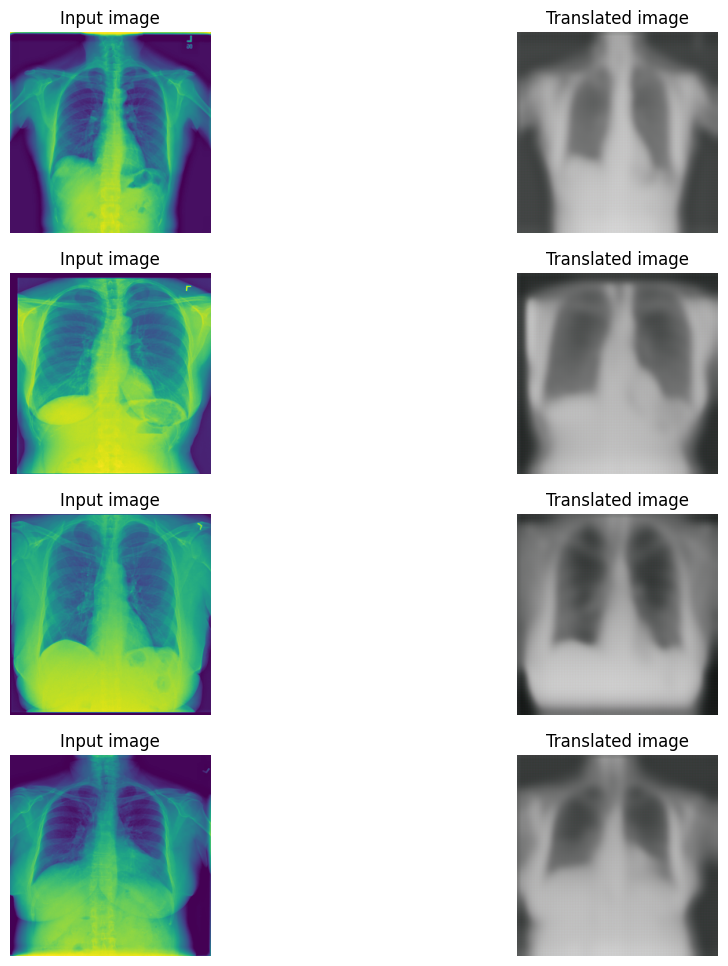

79/79 [==============================] - 14s 178ms/step - G_loss: 3.1144 - F_loss: 3.2848 - D_X_loss: 0.0076 - D_Y_loss: 0.0082
Epoch 8/25
79/79 [==============================] - ETA: 0s - G_loss: 3.0430 - F_loss: 3.2166 - D_X_loss: 0.0055 - D_Y_loss: 0.0064

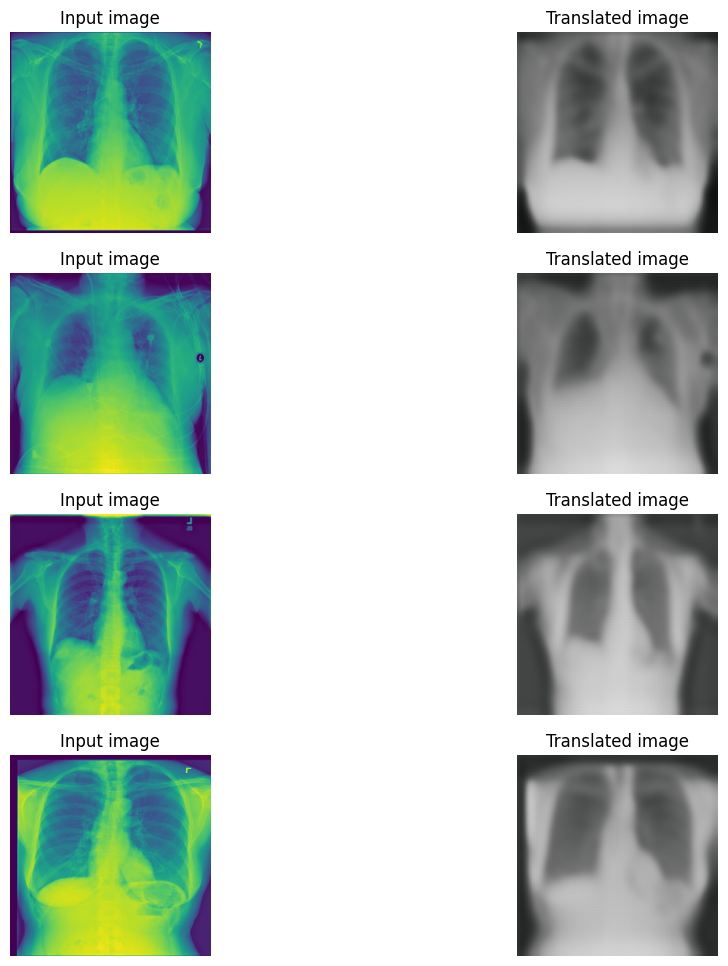

79/79 [==============================] - 14s 176ms/step - G_loss: 3.0457 - F_loss: 3.2181 - D_X_loss: 0.0055 - D_Y_loss: 0.0063
Epoch 9/25
79/79 [==============================] - ETA: 0s - G_loss: 2.9716 - F_loss: 3.1631 - D_X_loss: 0.0042 - D_Y_loss: 0.0047

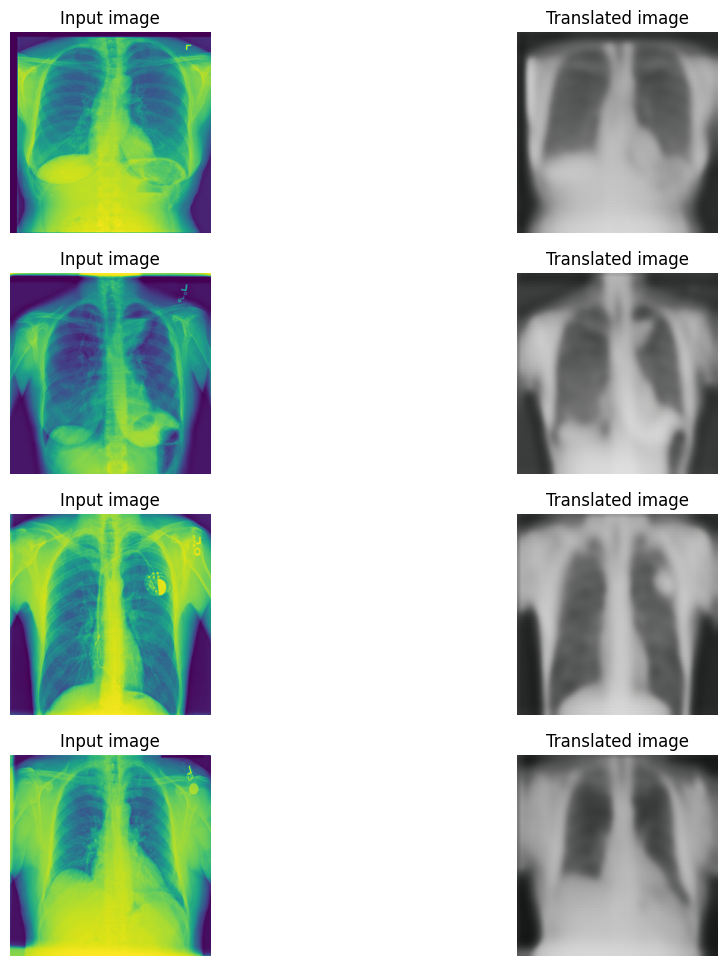

79/79 [==============================] - 14s 176ms/step - G_loss: 2.9724 - F_loss: 3.1662 - D_X_loss: 0.0041 - D_Y_loss: 0.0046
Epoch 10/25
79/79 [==============================] - ETA: 0s - G_loss: 2.9181 - F_loss: 3.1164 - D_X_loss: 0.0031 - D_Y_loss: 0.0033

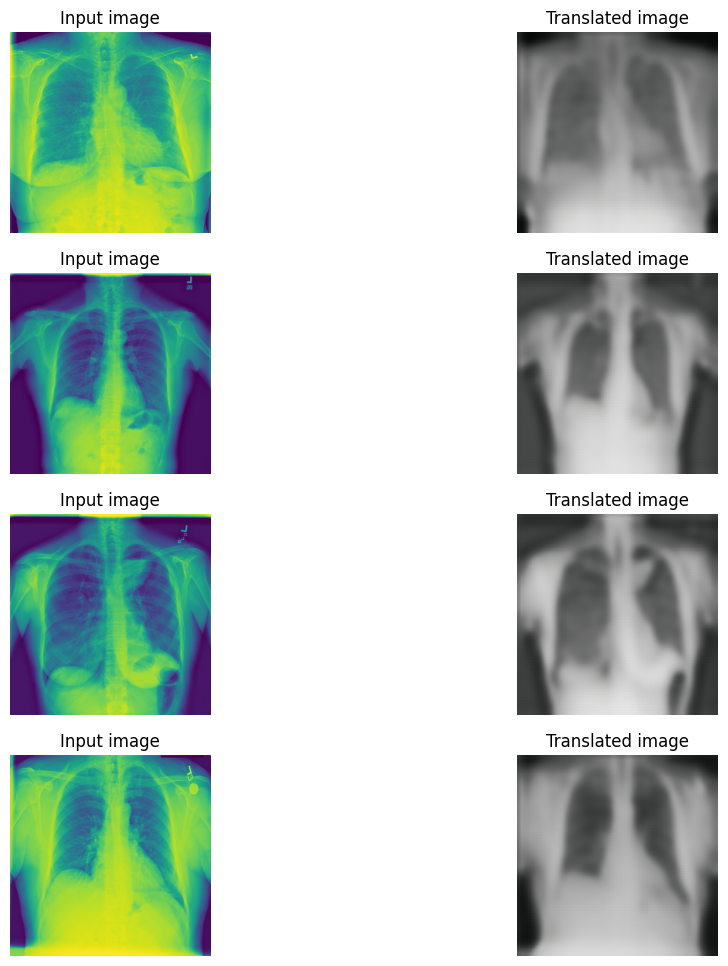

79/79 [==============================] - 14s 174ms/step - G_loss: 2.9190 - F_loss: 3.1195 - D_X_loss: 0.0031 - D_Y_loss: 0.0032
Epoch 11/25
79/79 [==============================] - ETA: 0s - G_loss: 2.8782 - F_loss: 3.0667 - D_X_loss: 0.0023 - D_Y_loss: 0.0028

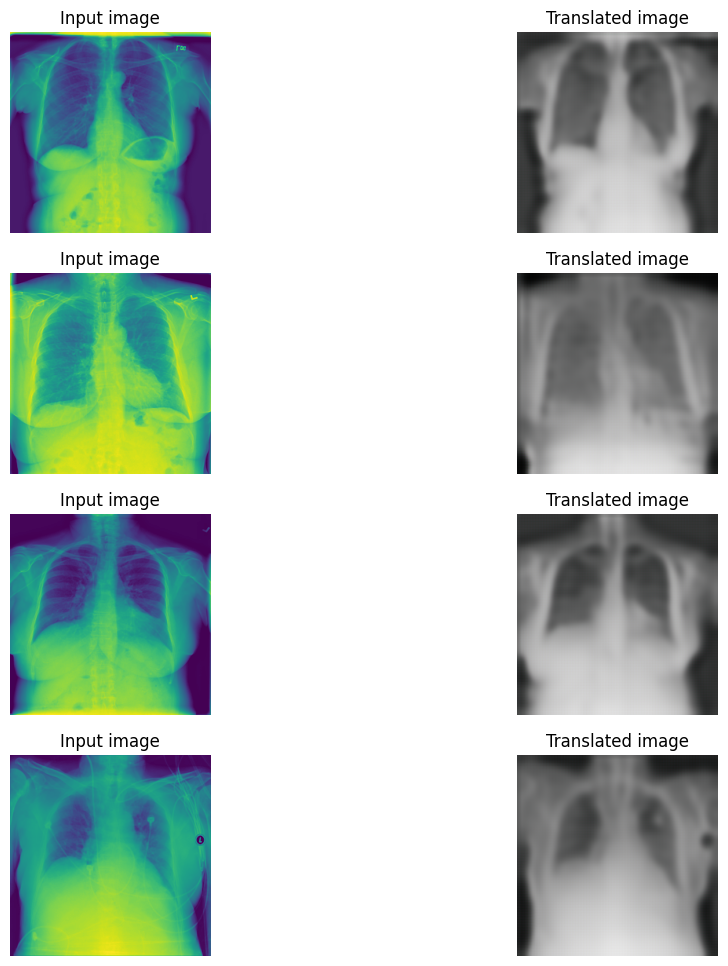

79/79 [==============================] - 12s 148ms/step - G_loss: 2.8787 - F_loss: 3.0703 - D_X_loss: 0.0023 - D_Y_loss: 0.0028
Epoch 12/25
79/79 [==============================] - ETA: 0s - G_loss: 2.8490 - F_loss: 3.0377 - D_X_loss: 0.0019 - D_Y_loss: 0.0023

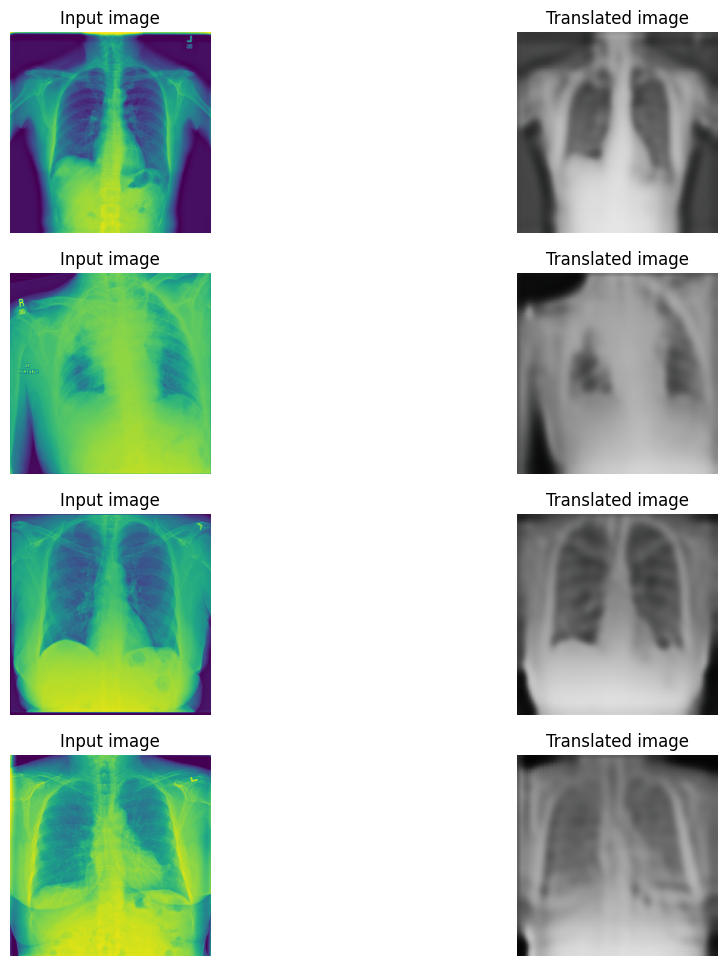

79/79 [==============================] - 14s 177ms/step - G_loss: 2.8494 - F_loss: 3.0412 - D_X_loss: 0.0019 - D_Y_loss: 0.0023
Epoch 13/25
79/79 [==============================] - ETA: 0s - G_loss: 2.8132 - F_loss: 3.0114 - D_X_loss: 0.0016 - D_Y_loss: 0.0021

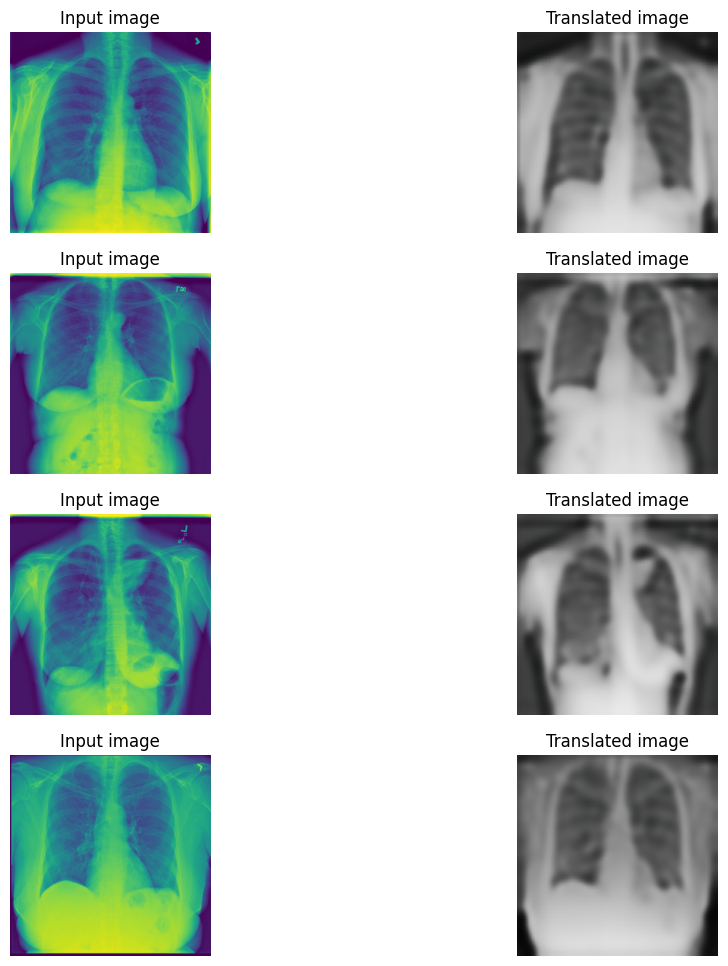

79/79 [==============================] - 12s 149ms/step - G_loss: 2.8133 - F_loss: 3.0153 - D_X_loss: 0.0015 - D_Y_loss: 0.0021
Epoch 14/25
79/79 [==============================] - ETA: 0s - G_loss: 2.7771 - F_loss: 2.9803 - D_X_loss: 0.0016 - D_Y_loss: 0.0019

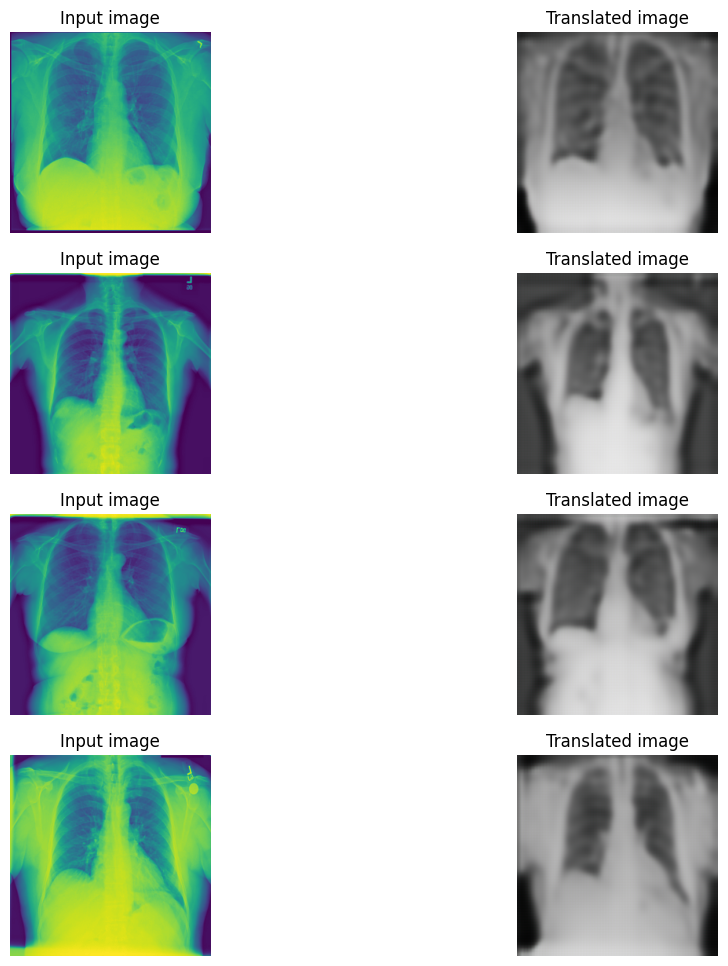

79/79 [==============================] - 12s 149ms/step - G_loss: 2.7773 - F_loss: 2.9851 - D_X_loss: 0.0016 - D_Y_loss: 0.0019
Epoch 15/25
79/79 [==============================] - ETA: 0s - G_loss: 2.7452 - F_loss: 2.9503 - D_X_loss: 0.0014 - D_Y_loss: 0.0016

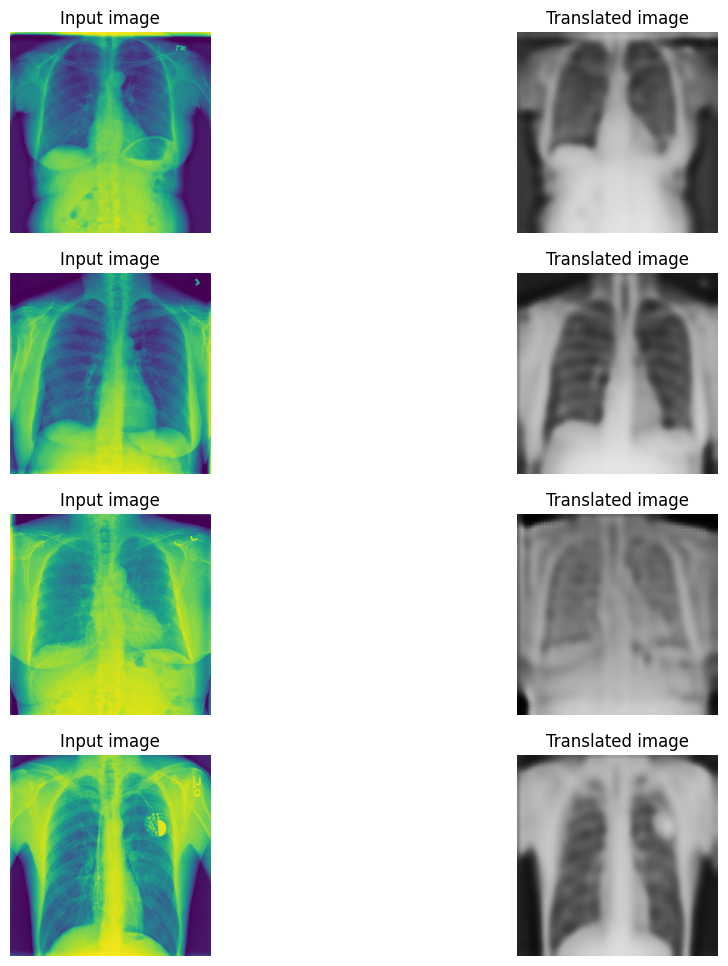

79/79 [==============================] - 12s 150ms/step - G_loss: 2.7444 - F_loss: 2.9549 - D_X_loss: 0.0014 - D_Y_loss: 0.0016
Epoch 16/25
79/79 [==============================] - ETA: 0s - G_loss: 2.7325 - F_loss: 2.9251 - D_X_loss: 0.0013 - D_Y_loss: 0.0015

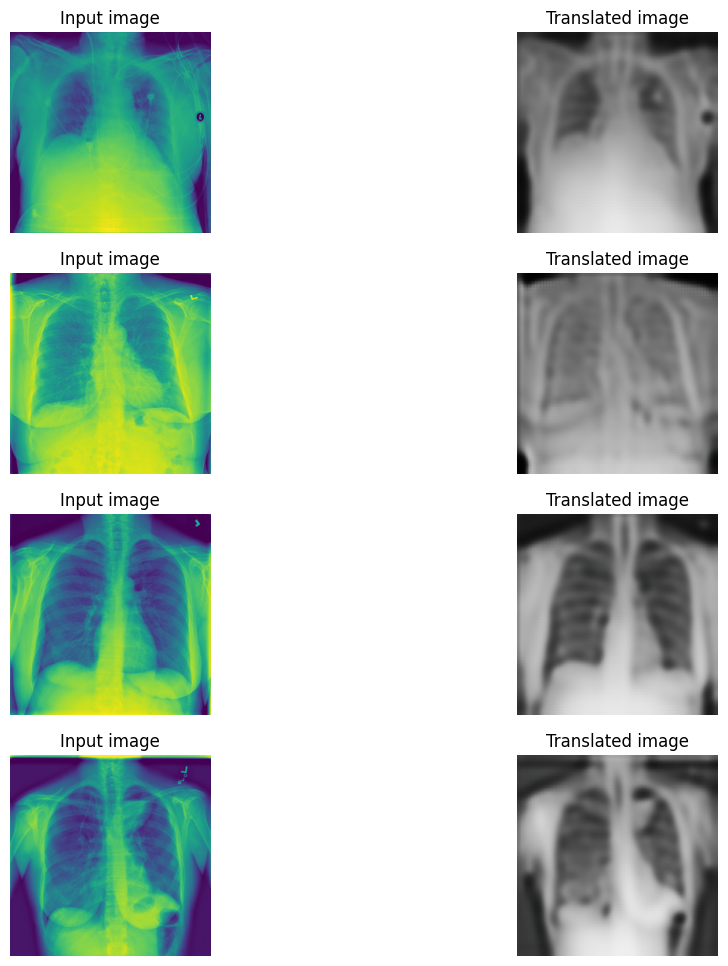

79/79 [==============================] - 12s 149ms/step - G_loss: 2.7321 - F_loss: 2.9298 - D_X_loss: 0.0013 - D_Y_loss: 0.0015
Epoch 17/25
79/79 [==============================] - ETA: 0s - G_loss: 2.6963 - F_loss: 2.9039 - D_X_loss: 0.0011 - D_Y_loss: 0.0014

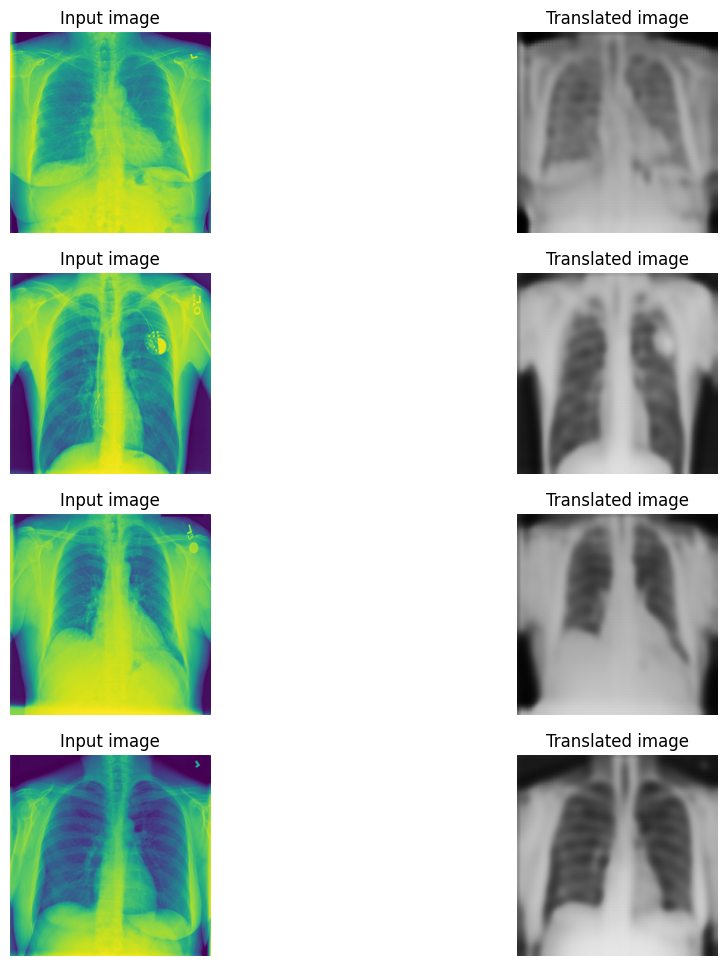

79/79 [==============================] - 12s 150ms/step - G_loss: 2.6956 - F_loss: 2.9078 - D_X_loss: 0.0011 - D_Y_loss: 0.0014
Epoch 18/25
79/79 [==============================] - ETA: 0s - G_loss: 2.6833 - F_loss: 2.8849 - D_X_loss: 0.0010 - D_Y_loss: 0.0011

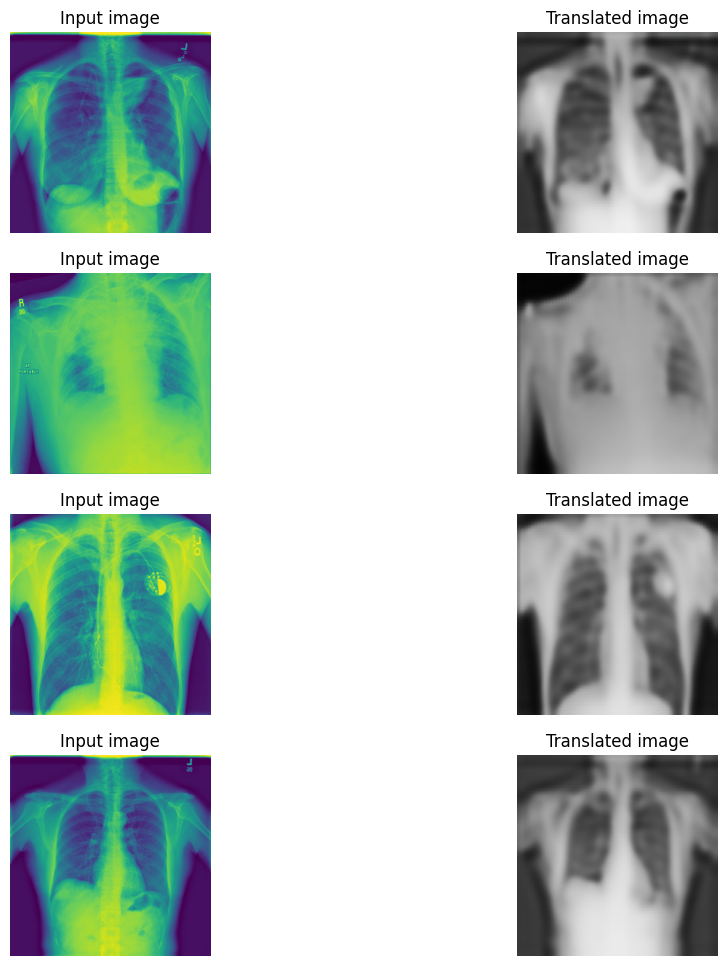

79/79 [==============================] - 12s 150ms/step - G_loss: 2.6833 - F_loss: 2.8890 - D_X_loss: 0.0010 - D_Y_loss: 0.0011
Epoch 19/25
79/79 [==============================] - ETA: 0s - G_loss: 2.6853 - F_loss: 2.8521 - D_X_loss: 9.2808e-04 - D_Y_loss: 0.0010

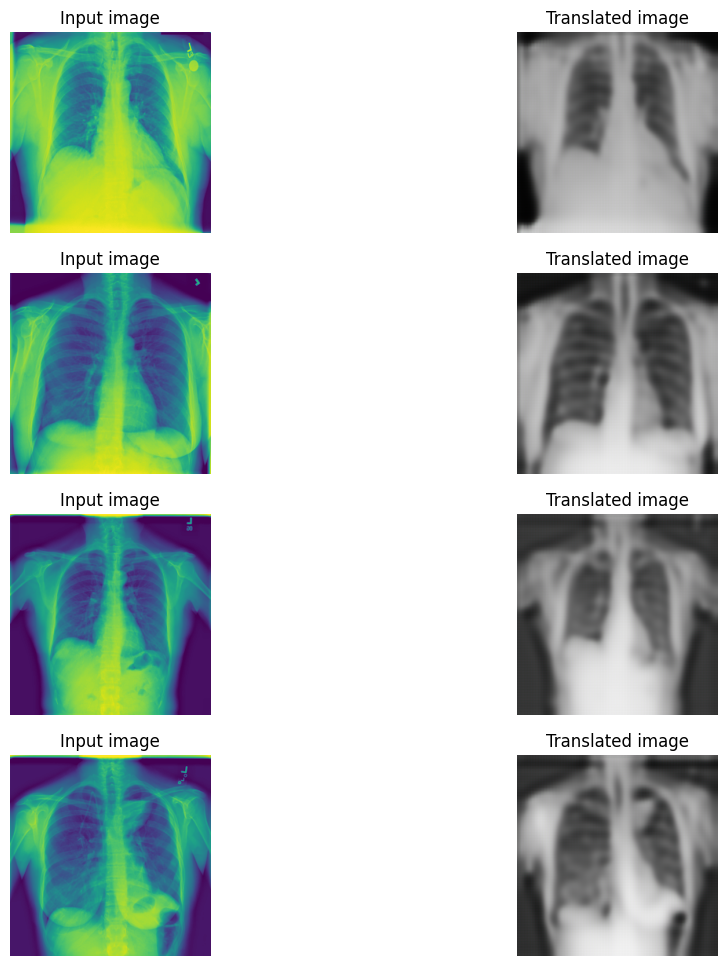

79/79 [==============================] - 12s 149ms/step - G_loss: 2.6843 - F_loss: 2.8564 - D_X_loss: 9.2571e-04 - D_Y_loss: 0.0010
Epoch 20/25
79/79 [==============================] - ETA: 0s - G_loss: 2.6610 - F_loss: 2.8326 - D_X_loss: 9.0699e-04 - D_Y_loss: 9.8501e-04

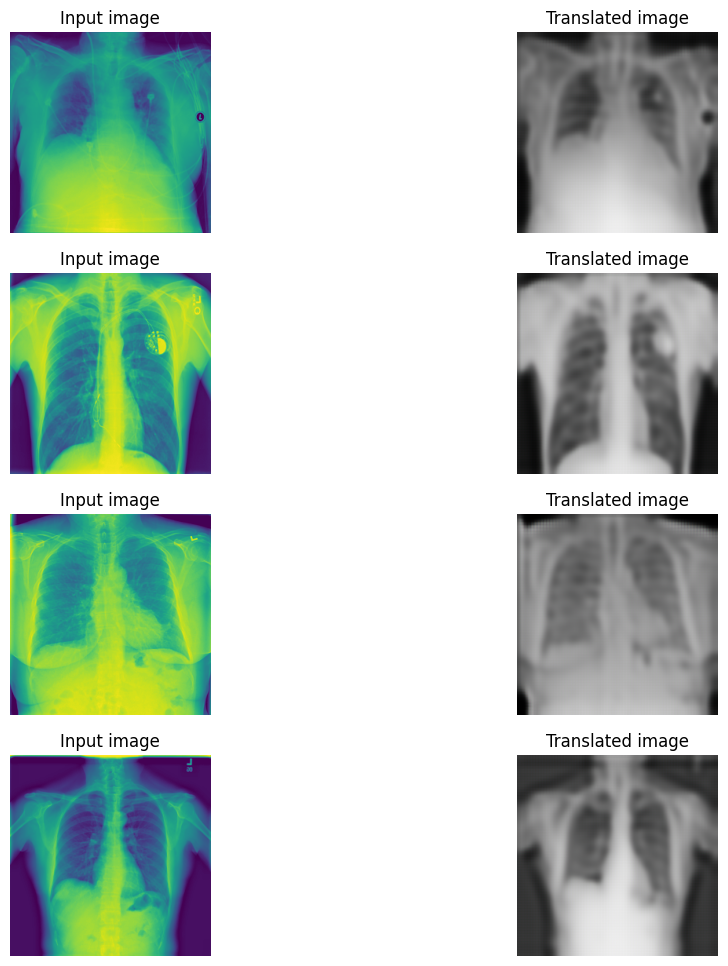

79/79 [==============================] - 12s 151ms/step - G_loss: 2.6607 - F_loss: 2.8351 - D_X_loss: 9.0544e-04 - D_Y_loss: 9.7727e-04
Epoch 21/25
79/79 [==============================] - ETA: 0s - G_loss: 2.6335 - F_loss: 2.8170 - D_X_loss: 8.4402e-04 - D_Y_loss: 8.8228e-04

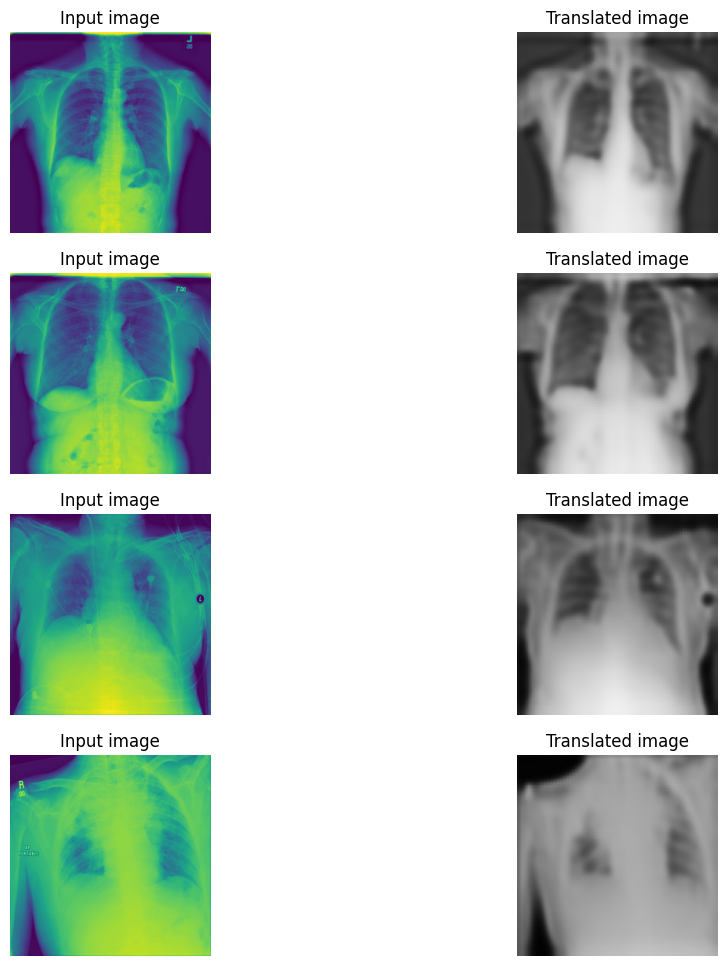

79/79 [==============================] - 12s 151ms/step - G_loss: 2.6336 - F_loss: 2.8198 - D_X_loss: 8.4202e-04 - D_Y_loss: 8.7533e-04
Epoch 22/25
79/79 [==============================] - ETA: 0s - G_loss: 2.6437 - F_loss: 2.8105 - D_X_loss: 8.1372e-04 - D_Y_loss: 7.9670e-04

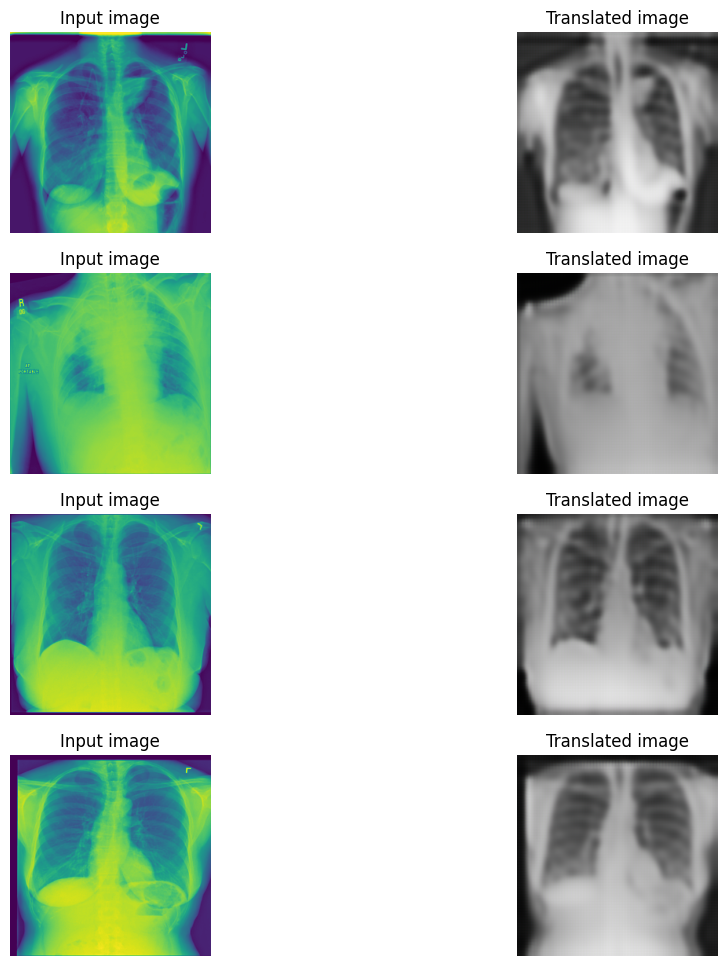

79/79 [==============================] - 12s 149ms/step - G_loss: 2.6429 - F_loss: 2.8162 - D_X_loss: 8.1107e-04 - D_Y_loss: 7.9070e-04
Epoch 23/25
79/79 [==============================] - ETA: 0s - G_loss: 2.6262 - F_loss: 2.7981 - D_X_loss: 6.9852e-04 - D_Y_loss: 7.5249e-04

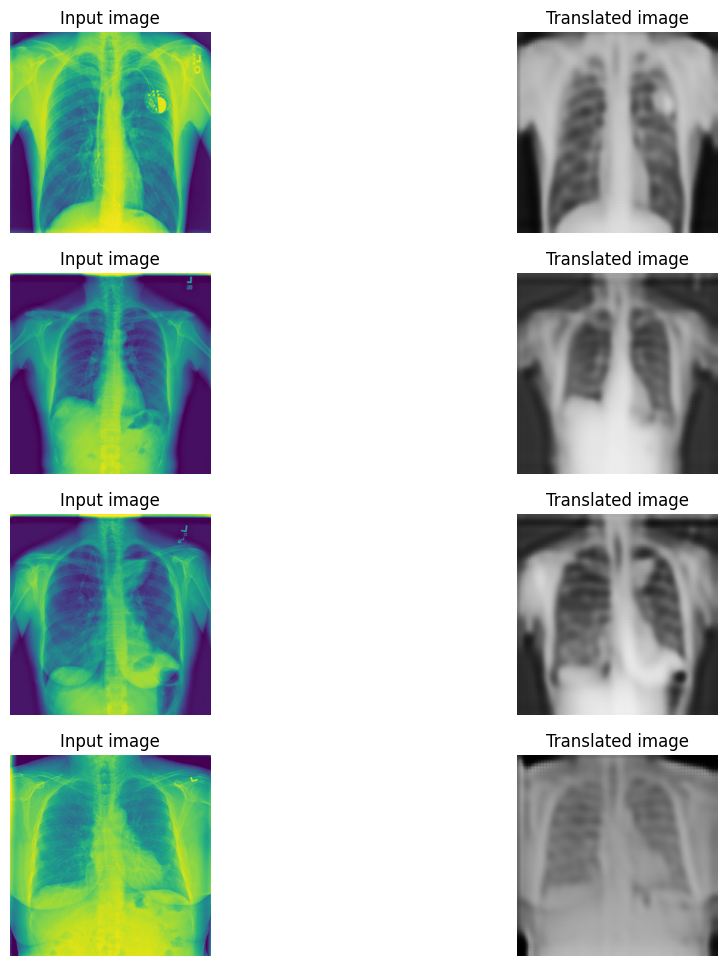

79/79 [==============================] - 12s 149ms/step - G_loss: 2.6257 - F_loss: 2.8012 - D_X_loss: 6.9879e-04 - D_Y_loss: 7.4660e-04
Epoch 24/25
79/79 [==============================] - ETA: 0s - G_loss: 2.6365 - F_loss: 2.7722 - D_X_loss: 6.1110e-04 - D_Y_loss: 6.6418e-04

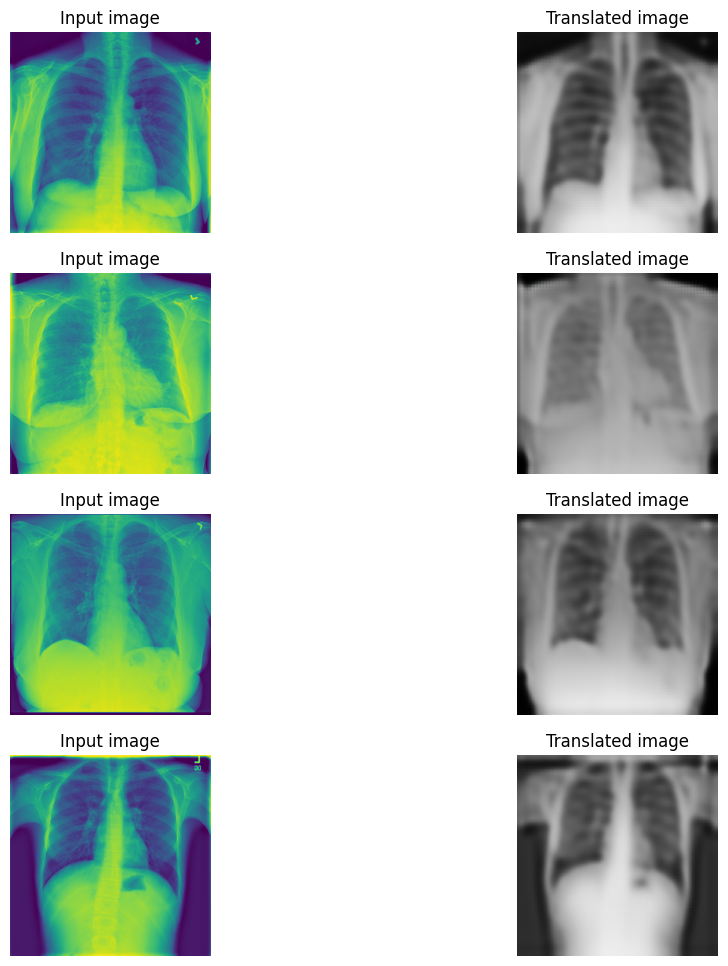

79/79 [==============================] - 12s 150ms/step - G_loss: 2.6361 - F_loss: 2.7749 - D_X_loss: 6.1103e-04 - D_Y_loss: 6.6065e-04
Epoch 25/25
79/79 [==============================] - ETA: 0s - G_loss: 2.6187 - F_loss: 2.7637 - D_X_loss: 6.5819e-04 - D_Y_loss: 5.9155e-04

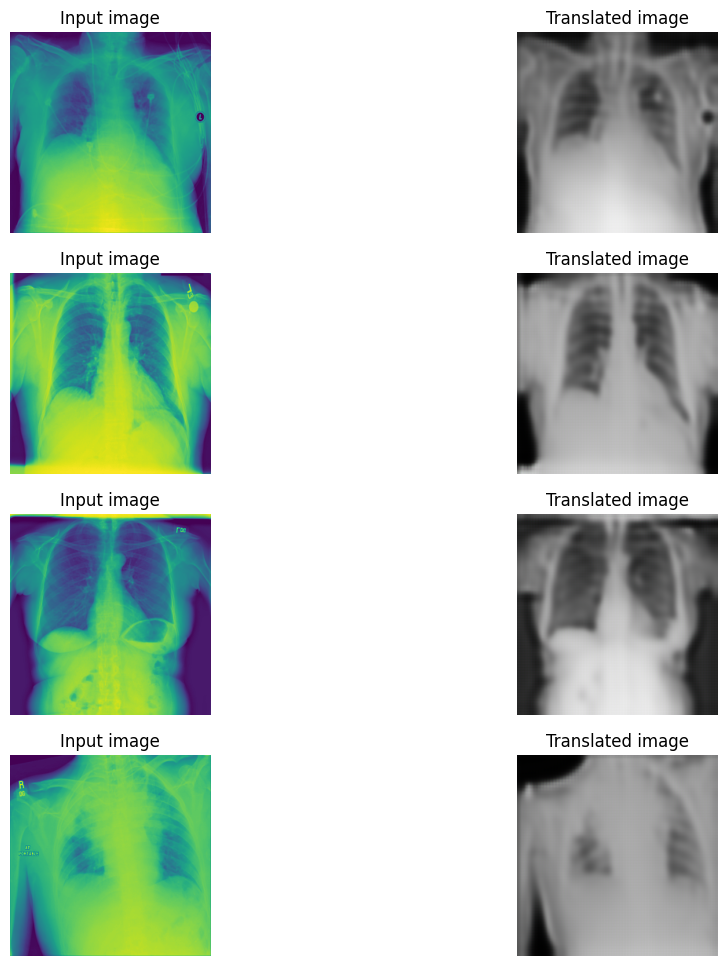

79/79 [==============================] - 12s 150ms/step - G_loss: 2.6171 - F_loss: 2.7654 - D_X_loss: 6.5768e-04 - D_Y_loss: 5.8837e-04


In [ ]:
# Here we will train the model for just one epoch as each epoch takes around
# 7 minutes on a single P100 backed machine.
cycle_gan_model.fit(
    tf.data.Dataset.zip((tf_dataset_train_org_processed, tf_dataset_train_dis_processed)),
    epochs=25,
    callbacks=[plotter, model_checkpoint_callback],
)

#1 epoch - training

In [ ]:
for i, img in enumerate(tf_dataset_train_org_processed.take(-1)):
    prediction = cycle_gan_model.gen_G(img)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)
    prediction = keras.utils.array_to_img(prediction)
    prediction.save("/content/drive/MyDrive/CS 518 Project /Final Augmented Images/{dis}/{dis}_{i}_{epoch}.png".format(dis=disease, i=i+1, epoch="Final"))

In [ ]:
len(tf_dataset_train_org_processed)

79